<a href="https://colab.research.google.com/github/layely/DeepLearning-Course-UdeM/blob/master/TP2_part1_with_transfert.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


# Data preparation


## Authenticate to GDrive

In [0]:
# Code to read csv file into Colaboratory
!pip install -U -q PyDrive
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

# Authenticate and create the PyDrive client.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

    100% |████████████████████████████████| 993kB 17.1MB/s 


## Download dataset (csv file)

In [0]:
import os

# Gdrive link of the dataset 
link = 'https://drive.google.com/open?id=1TOqmHMvgVpy0cjEQzggaNF24HJUXfqwt'
  
_, id = link.split('=')

# Download CSV file
downloaded = drive.CreateFile({'id':id})
downloaded.GetContentFile('FaceData.csv')
print("Donwload finished")

Donwload finished


## Load dataset with pandas


In [0]:
try:
  import pandas as pd
except:
  !pip install pandas
  import pandas as pd
finally:
  print("Pandas loaded")
  
dataset_path = "FaceData.csv"
dataFrame = pd.read_csv(dataset_path)

Pandas loaded


In [0]:
print("Initial shape:", dataFrame.shape)
#dataFrame.head()
dataFrame = dataFrame.dropna()
print("Shape after rows with empty entries dropped", dataFrame.shape)

Initial shape: (7049, 31)
Shape after rows with empty entries dropped (2140, 31)


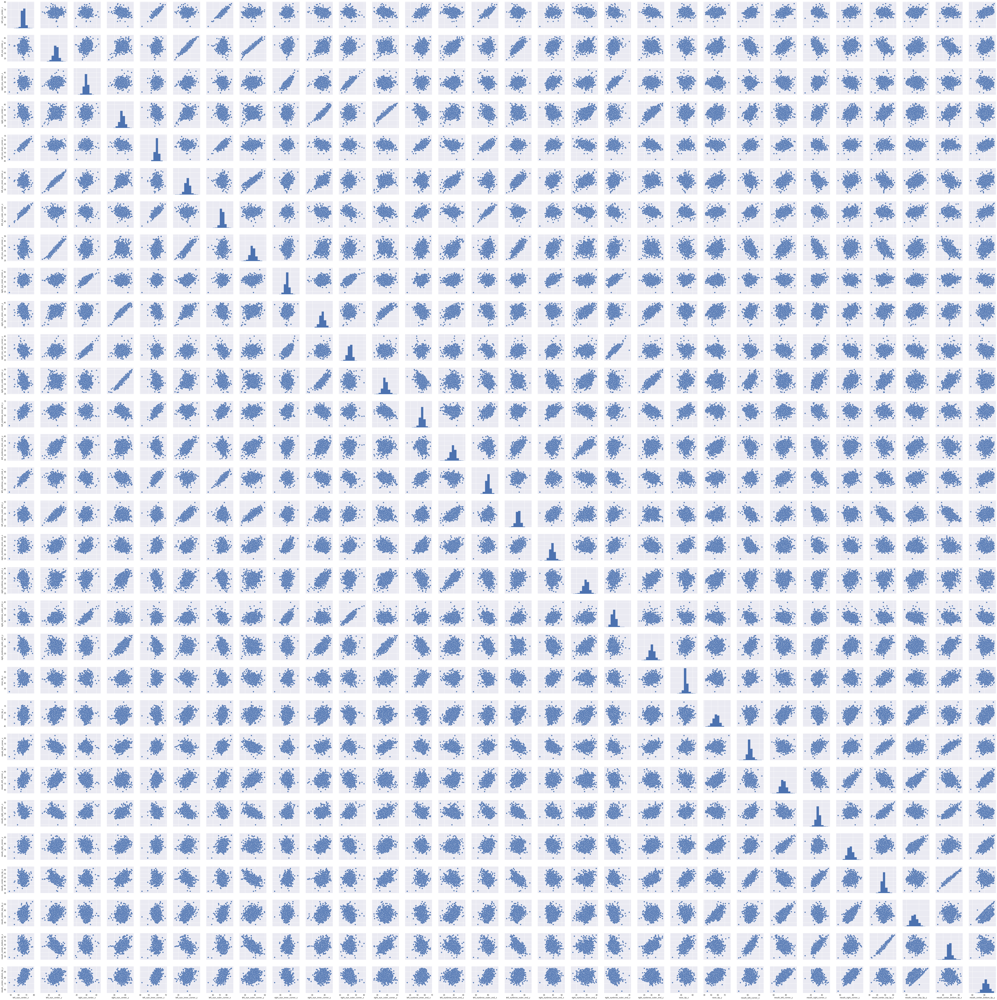

In [0]:
import seaborn as sns

sns.pairplot(dataFrame)

In [0]:
# https://www.kaggle.com/c/tgs-salt-identification-challenge/discussion/63710
# https://medium.com/datadriveninvestor/building-neural-network-using-keras-for-regression-ceee5a9eadff
try:
  import numpy as np
except:
  !pip install numpy
  import numpy as np
images = []
ground_truths = []
for i, row in dataFrame.iterrows():
  one_channel_img = np.array(row[-1].split(" ")).astype(np.float)
  three_channel_img = np.repeat(one_channel_img.reshape(96, 96, 1), 3, axis=2)
  images.append(three_channel_img)
  ground_truths.append(np.array([e for e in row[0:-1]]))
  
images = np.array(images)
ground_truths = np.array(ground_truths)
print(images)
print(ground_truths)
print(images.shape)
print(ground_truths.shape)


## Normalize outputs
Without output normalization (from 0-96 to 0 - 1 with 96 being the size of the image), some predictions can get out of range. For example predicting a cordonates x = 100 or -5 in a 96x96 images is not something we want to occur. We also gained notable improvement after applying normalization.

In [0]:
from sklearn.preprocessing import  MinMaxScaler

unscalled_ground_truths = ground_truths
ground_truths = ground_truths / 96.

print(ground_truths)


[[0.68784962 0.40627368 0.31486466 ... 0.75974436 0.4492782  0.88006015]
 [0.67013475 0.36427163 0.31197163 ... 0.73194326 0.47362411 0.89041844]
 [0.67767763 0.36364211 0.32191447 ... 0.73116447 0.49244737 0.81936842]
 ...
 [0.71282152 0.40262474 0.30099851 ... 0.82336594 0.49142436 0.93275544]
 [0.66825187 0.31970408 0.28125935 ... 0.82605655 0.61053214 0.8370369 ]
 [0.69462245 0.35920238 0.32067177 ... 0.79128742 0.55128512 0.86105273]]



## Split data into train and test set
80% train and 20% test
We ended up with 1712 images for test and 428 for test.

In [0]:
train_size = int(len(images) * 80/100)
X_train = images[:train_size]
Y_train = ground_truths[:train_size]
X_test = images[train_size:]
#print(X_test)
Y_test = ground_truths[train_size:]

#print("Train size:", len(X_train))
#print("Test size:", len(X_test))
#print("Number of cordinates to predict:", Y_train.shape[1])
print("train size:", X_train.shape[0])
print("test size:", X_test.shape[0])

train size: 1712
test size: 428


#Model definition

After applying normalization, we faced an issue where the network predict almost the same value for all images and the values was always close to 0 or 1 (minimum and maximum value). To resolve this, we used VarianceScaling with very smale scale (1e-4) and started to see some improvement in the learning but the predicted values were still very similar. We deal with this second issue by adding BatchNormalization and changing ReLU layers with LeakyRelu layers as activation functions. Things went better specially during training and validation but we felt the that testing results (generalization) could still be improved. So we added Dropout layers and as expected the network were able to generalize better.

In [0]:
from keras.models import Sequential
from keras.models import Model
from keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D, GlobalMaxPooling2D
from keras.layers import Activation, Dropout, Flatten, Dense, LeakyReLU, BatchNormalization
from keras.initializers import VarianceScaling
from keras.utils.vis_utils import plot_model
from keras.applications.vgg16 import VGG16

%matplotlib inline
import matplotlib.pyplot as plt


import numpy as np

def getModel(input_shape, loss, optimizer, num_freeze=0):
  base_model = VGG16(input_shape=input_shape, weights='imagenet', include_top=False)
  
  x = base_model.output
  #x = GlobalAveragePooling2D()(x)
  x = Flatten()(x)
  x = Dropout(0.5)(x)
  x = Dense(1024, kernel_initializer=VarianceScaling(scale=1e-4))(x)
  x = BatchNormalization()(x)
  x = LeakyReLU()(x)
  
  x = Dense(512)(x)
  x = BatchNormalization()(x)
  x = LeakyReLU()(x)
  
  x = Dropout(0.2)(x)
  x = Dense(30, kernel_initializer=VarianceScaling(scale=1e-4))(x)
  x = BatchNormalization()(x)
  y = Activation('sigmoid')(x)

  
  model = Model(inputs=base_model.input, outputs=y)
  
  # Freeze layers the first 'num_freeze' layers 
  for layer in model.layers[:num_freeze]:
    layer.trainable = False
  for layer in model.layers[num_freeze:]:
    layer.trainable = True
  
  model.compile(loss=loss, optimizer=optimizer, metrics=['mae'])
  return model

# Visualize model
model_v = getModel(input_shape=(96,96, 3), loss="mse", optimizer="rmsprop")
model_v.summary()
print("Number of layers:", len(model_v.layers))

Using TensorFlow backend.


Instructions for updating:
Colocations handled automatically by placer.
58892288/58889256 [==============================] - 2s 0us/step
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 96, 96, 3)         0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 96, 96, 64)        1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 96, 96, 64)        36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 48, 48, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 48, 48, 128)       73856     
______________________

# Training

## Define Callbacks

Here we define three callbacks: 
* `reduce_lr_callback` which reduces the learning rate by a factor of 0.2 when the validation loss is almost static after 5 epochs.
* `checkpoint_loss_callback` which save the entire model after each epoch where we get a better validation accuracy.
* `early_stopping_callback` that stops the training when no improvement is made with respect to val loss after 15 epochs.

In [0]:
from keras.callbacks import Callback, ReduceLROnPlateau, ModelCheckpoint, EarlyStopping

reduce_lr_callback = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.001)


SAVED_MODEL_PATH = "best_model_loss_ownmodel.h5"
checkpoint_loss_callback = ModelCheckpoint(SAVED_MODEL_PATH, monitor='val_loss', verbose=1, save_best_only=True, 
                                save_weights_only=False, mode='min', period=1)

early_stopping_callback = EarlyStopping(monitor='val_loss', min_delta=1e-4, patience=15, verbose=0, mode='min', baseline=None, restore_best_weights=False)

## Init model parameters

In this subsections we initialize the training parameters. We tested various loss fonctions such as mse, mae etc... but the best result comes from rmse that we defined below. The learning we fixed at 0.001 and Adam is used as optimizer. We also uses a batch size of 16 during training.

In [0]:
from keras import optimizers
from keras import backend as K
from keras import losses

# Set training hyperparameters
INPUT_WIDTH = 96
INPUT_HEIGHT = 96
NUM_EPOCHS = 100
BATCH_SIZE = 16
LEARNING_RATE = 0.01

# root_mean_squared_error (RMSE)
def rmse(y_true, y_pred):
        return K.sqrt(K.mean(K.square(y_pred - y_true))) 

#Different losses tested
#loss = 'mae'
#loss = 'mse'
#loss = 'msle'
#loss = 'kld'
#loss = 'cosine'
loss = rmse

optimizer = optimizers.Adam(LEARNING_RATE)


model = getModel(input_shape=(INPUT_WIDTH, INPUT_HEIGHT, 3), loss=loss,
                 optimizer=optimizer, num_freeze=10)

## Fit Models
We run the training with 0.2 of images used as our validation set. The trained ended with val loss (rmse) equal to 0.021 (rmse) and mae (our metrics used for evalution) reached a minimum of 0.0147 (~1.41 pixel)

In [0]:
from keras.applications.vgg16 import preprocess_input

# Run training

history = model.fit(x=preprocess_input(X_train), y=Y_train, 
                    batch_size=BATCH_SIZE, 
                    epochs=NUM_EPOCHS, verbose=1, 
                    validation_split=0.2, 
                    shuffle=True,
                    callbacks=[checkpoint_loss_callback, reduce_lr_callback, early_stopping_callback])


Instructions for updating:
Use tf.cast instead.
Train on 1369 samples, validate on 343 samples
Epoch 1/100
1369/1369 [==============================] - 16s 12ms/step - loss: 0.1722 - mean_absolute_error: 0.1350 - val_loss: 0.0623 - val_mean_absolute_error: 0.0455

Epoch 00001: val_loss improved from inf to 0.06230, saving model to best_model_loss_ownmodel.h5
Epoch 2/100
1369/1369 [==============================] - 9s 7ms/step - loss: 0.0347 - mean_absolute_error: 0.0248 - val_loss: 0.0361 - val_mean_absolute_error: 0.0269

Epoch 00002: val_loss improved from 0.06230 to 0.03613, saving model to best_model_loss_ownmodel.h5
Epoch 3/100
1369/1369 [==============================] - 9s 7ms/step - loss: 0.0257 - mean_absolute_error: 0.0193 - val_loss: 0.0354 - val_mean_absolute_error: 0.0262

Epoch 00003: val_loss improved from 0.03613 to 0.03539, saving model to best_model_loss_ownmodel.h5
Epoch 4/100
1369/1369 [==============================] - 9s 7ms/step - loss: 0.0246 - mean_absolute_err

## Learning curves
We run the training on 49 epochs (automatic stop enabled) and were able to get training and validation mean absolute error of ~0.85 and ~1.41 pixels respectively which is pretty satisfiying given the small dataset we have. The training was stable and convergence is reached at the 34th epoch exactly. 

dict_keys(['val_loss', 'val_mean_absolute_error', 'loss', 'mean_absolute_error', 'lr'])


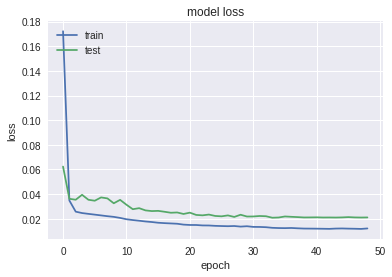

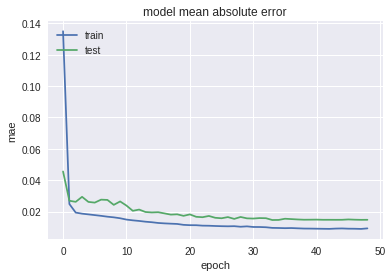

In [0]:
import matplotlib.pyplot as plt

print(history.history.keys())

# Plot curve for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
#plt.xlim(left=1)
#plt.ylim(top=5)
plt.show()

# Plot curve for mae
plt.plot(history.history['mean_absolute_error'])
plt.plot(history.history['val_mean_absolute_error'])
plt.title('model mean absolute error')
plt.ylabel('mae')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
#plt.xlim(left=1)
#plt.ylim(top=5)
plt.show()

# Model evaluation
We evaluate our model using the MAE (mean absolute error) metric



## Accuracy and Loss scores

The model performed an mean absolute error of 0.021 (or 2.016 pixel) on the test set. Compared to the training performance (1.41 pixels MAE) we can say our model is good at generalizing despite the small availability of data in the training phase. With MAE as loss, we observe a slight decrease in perforcemence (2.2 pixels MA error) and without dropout we get a net performance decrease reaching +5 pixels with respect to the MAE metric.

In [0]:
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from keras.models import load_model

# delete model
#del model

# Load best model
model = load_model(SAVED_MODEL_PATH, custom_objects={'rmse': rmse})

print("metrics names:", model.metrics_names)

loss, mae = model.evaluate(x=preprocess_input(X_test), y=Y_test)

print("Loss: {}    ---   MAE: {}".format(round(loss, 3), round(mae, 3)))

metrics names: ['loss', 'mean_absolute_error']
428/428 [==============================] - 3s 6ms/step
Loss: 0.031    ---   MAE: 0.021


In [0]:
!ls

## Predicted values against actual values

Here we draw the diagram of the predicted values agains the actual values. We can see that the points are grouped around the central dotted line (representing the ground truths) in a "symetric" manner. This shows that the predictions are overall good. The dots between the two slimmer dotted lines have a absolute error less than 5 pixels.



428/428 [==============================] - 6s 14ms/step


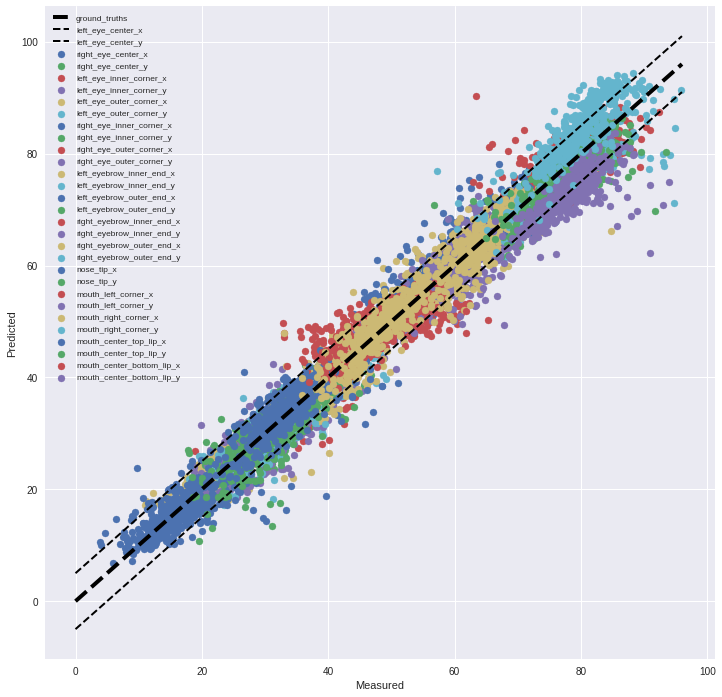

In [0]:
y_test = Y_test * 96
y_pred = model.predict(preprocess_input(X_test), batch_size=1, verbose=1) * 96

#print(y_test)
#print("----------")
#print(y_pred)

#print()
#print("----***---")
#print(y_test[:,0])
#print("--------")
#print(y_pred[:,0])
#print(y_pred[:,0])

thresh = 5. #pixels

fig, ax = plt.subplots(figsize=(12,12))
#ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=4)
ax.plot([0., 96], [0., 96], 'k--', lw=4)
ax.plot([0, 96.], [thresh, 96. + thresh], 'k--', lw=2)
ax.plot([0, 96.], [-thresh, 96. - thresh], 'k--', lw=2)
for i in range(30):
  ax.scatter(y_test[:,i], y_pred[:,i])
ax.set_xlabel('Measured')
ax.set_ylabel('Predicted')
labels = ['ground_truths'] + dataFrame.columns.values.tolist()[:-1]
ax.legend(labels, fontsize='small')
plt.show()

# Histogram of mean absolute error per image

This histogram shows the distributions of the MAE per image on the range 1 - 7.  It can be observed that most of the prediction errors lay in the range 1-3 and the maximum error is marginally above 7 pixles. Comparitively, when we tested using MAE as our loss function,  a few error were above 20 pixels.



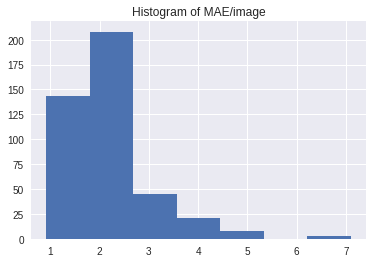

In [0]:
#print(y_test)
#print("-------------")
#print(y_pred)

diff = np.abs(y_test - y_pred)

means = np.mean(diff, axis=1)
#print(means)

plt.hist(means, bins=7) #np.histogram(means, bins=10)
plt.title("Histogram of MAE/image")
plt.show()

# Exemples of bad and good predictions

In [0]:
i_top3_bad = means.argsort()[-3:]
i_top3_good = means.argsort()[:3]
print(i_top3_bad)
print(i_top3_good)
#print(np.sort(means)[-3:])


[153 378 320]
[125 208 393]


## Define function that shows an image given its index with respect to the test array

In [0]:
%matplotlib inline
import matplotlib.pyplot as plt


def showImageWithDot(index):
  #print(X_test)
  img = X_test[index] /255.
  gt = y_test[index]
  pred = y_pred[index]
  
  plt.imshow(img, cmap='gray')

  # Draw ground truths
  plt.scatter(x=gt[::2], y=gt[1::2], c='r')
  
  # Draw predictions
  plt.scatter(x=pred[::2], y=pred[1::2], c='b')

  plt.legend(["ground truths", "predictions"], loc='upper center', 
             bbox_to_anchor=(0.5, -0.05),
             fancybox=True, shadow=True, ncol=2)
  plt.title("MAE: {}".format(means[index]))
  plt.show()
  
  # Restore orginal values for images
images = []
for i, row in dataFrame.iterrows():
  one_channel_img = np.array(row[-1].split(" ")).astype(np.float)
  three_channel_img = np.repeat(one_channel_img.reshape(96, 96, 1), 3, axis=2)
  images.append(three_channel_img)
  
images = np.array(images)


## Show top 3 bad predictions (RMSE loss)
Here we can notice that the network struggle  when the face are viewed from the side. 

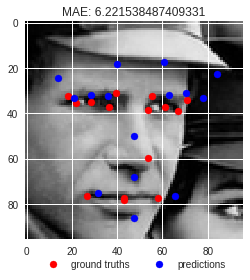

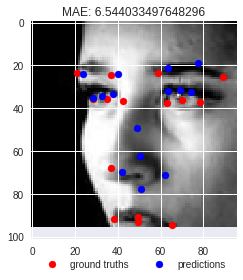

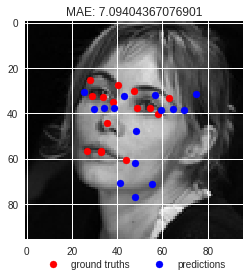

In [0]:
for i in i_top3_bad:

  

  

  
  showImageWithDot(i)



## Show top 3 good predictions (RMSE loss)

The best predictions are done when faces are viewed from the front and are straight.  Also, I notice that my model makes better predictions on men (:). This is more remarquable with my model trained with MAE as loss function. For illustration I pasted those images below.


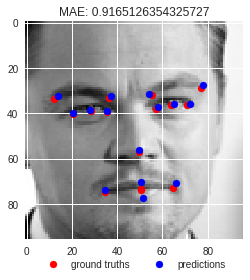

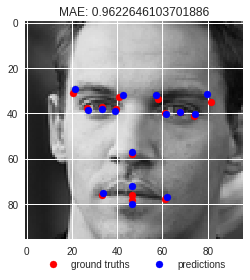

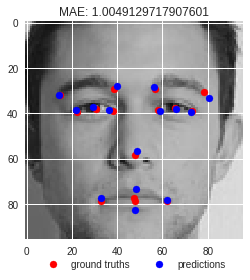

In [0]:
for i in i_top3_good:
  showImageWithDot(i)

## Show top 3 bad predictions (MAE loss)

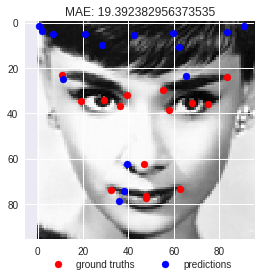

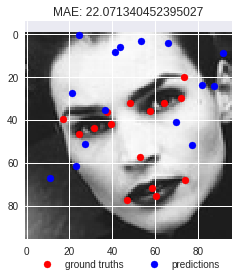

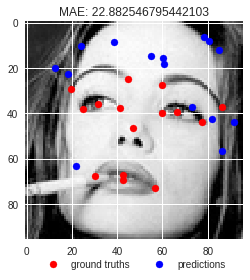

In [0]:
# do not run

## Show top 3 good predictions (MAE loss)

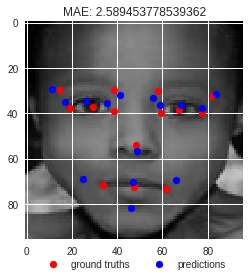

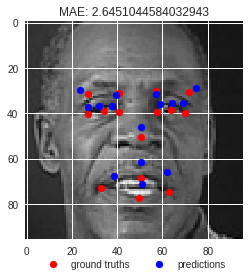

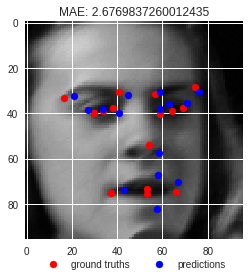

In [0]:
# Do not run

# Save best model in my Google Drive

In [0]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

#!ls "/content/drive/My Drive"
TP_DL_dir = "/content/drive/My\ Drive/TP_DL"

BEST_WEIGHTS = (TP_DL_dir + "/vgg_transfert_best_weights.hd5").replace('\ ', ' ')
BEST_MODEL = (TP_DL_dir + "/vgg_transfert_best_model.hd5").replace('\ ', ' ')

print(BEST_MODEL)

model.save_weights(BEST_WEIGHTS)
model.save(BEST_MODEL)

!ls {TP_DL_dir}

Mounted at /content/drive
/content/drive/My Drive/TP_DL/vgg_transfert_best_model.hd5
densenet_model.hd5    mobilenetv2_model.hd5    own_model_weights.hd5
densenet_weights.hd5  mobilenetv2_weights.hd5  vgg_transfert_best_model.hd5
FaceData.csv	      own_model.hd5	       vgg_transfert_best_weights.hd5
